In [1]:
# Mount drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os

In [4]:
path = '/content/drive/My Drive/yolov5'
os.chdir(path)

In [5]:
os.getcwd()

'/content/drive/My Drive/yolov5'

In [6]:
!ls

fsoco  yolov5


In [7]:
# !git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -qr yolov5/requirements.txt  # install dependencies (ignore errors)
%cd yolov5

     |████████████████████████████████| 645kB 18.6MB/s 
/content/drive/My Drive/yolov5/yolov5


# Let's check taht everything from initial tutorial works

In [ ]:
import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.7.0+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15079MB, multi_processor_count=40)


Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=416, iou_thres=0.45, save_conf=False, save_dir='inference/output', save_txt=False, source='inference/images/', update=False, view_img=False, weights=['yolov5s.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

Fusing layers... 
Model Summary: 140 layers, 7.45958e+06 parameters, 0 gradients
image 1/2 /content/drive/My Drive/yolov5/yolov5/inference/images/bus.jpg: 416x320 3 persons, 1 buss, Done. (0.043s)
image 2/2 /content/drive/My Drive/yolov5/yolov5/inference/images/zidane.jpg: 256x416 2 persons, 1 ties, Done. (0.017s)
Results saved to inference/output
Done. (1.360s)


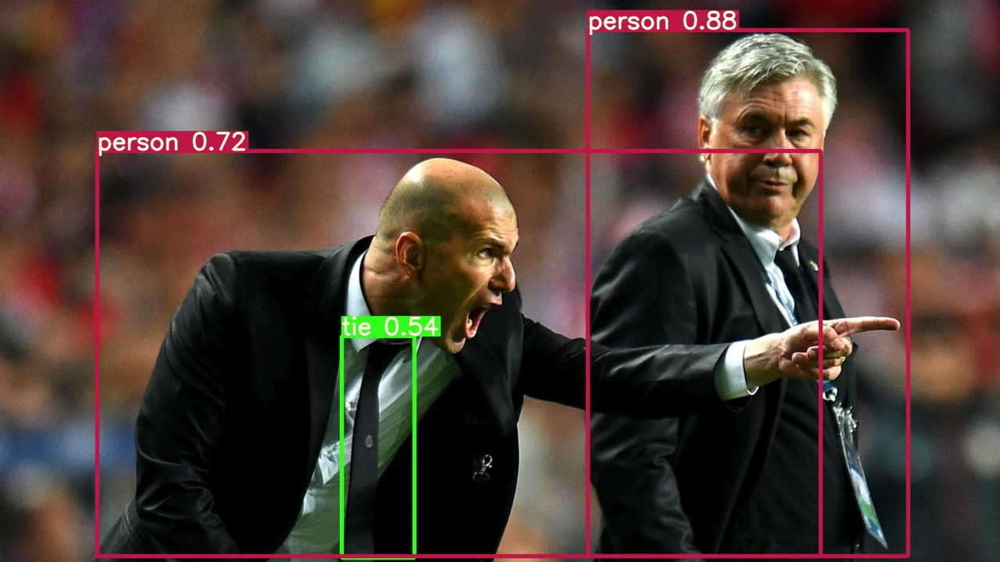

In [ ]:
!python detect.py --weights yolov5s.pt --img 416 --conf 0.4 --source inference/images/
Image(filename='inference/output/zidane.jpg', width=600)

In [ ]:
# Test

In [ ]:
# Download COCO val2017
gdrive_download('1Y6Kou6kEB0ZEMCCpJSKStCor4KAReE43','coco2017val.zip')  # val2017 dataset
!mv ./coco ../  # move folder alongside /yolov5

In [ ]:
# Run YOLOv5x on COCO val2017
!python test.py --weights yolov5s.pt --data coco.yaml --img 672 --verbose

Namespace(augment=False, batch_size=32, conf_thres=0.001, data='./data/coco.yaml', device='', img_size=672, iou_thres=0.65, save_json=True, save_txt=False, single_cls=False, task='val', verbose=True, weights=['yolov5s.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... 
Model Summary: 140 layers, 7.45958e+06 parameters, 0 gradients
Scanning labels ../coco/labels/val2017.cache (4952 found, 0 missing, 48 empty, 0 duplicate, for 5000 images): 5000it [00:00, 15869.36it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 157/157 [01:22<00:00,  1.91it/s]
                 all       5e+03    3.63e+04       0.354       0.654       0.556       0.354
              person       5e+03    1.08e+04       0.424       0.817       0.758       0.477
             bicycle       5e+03         314       0.311       0.576       0.506       0.247
                 car       5e+03    1.92e+03       0.327       0

In [ ]:
# Train

In [ ]:
# Download coco128
gdrive_download('1n_oKgR81BJtqk75b00eAjdv03qVCQn2f','coco128.zip')  # coco128 dataset
!mv ./coco128 ../  # move folder alongside /yolov5

In [ ]:
# Train YOLOv5s on coco128 for 3 epochs
!python train.py --img 640 --batch 16 --epochs 3 --data coco128.yaml --cfg yolov5s.yaml --weights yolov5s.pt --nosave --cache

Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/yolov5s.yaml', data='./data/coco128.yaml', device='', epochs=3, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[640, 640], local_rank=-1, logdir='runs/', multi_scale=False, name='', noautoanchor=False, nosave=True, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=16, weights='yolov5s.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
2020-10-21 10:08:11.258011: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'warmup_bias_lr': 0.1, 'box': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'obj': 1.0, 'obj

# Let's run on FSOCO

In [ ]:
# Train on FSOCO

In [ ]:
!python train.py --img 1024 --batch 16 --epochs 300 --data fsoco.yaml --weights yolov5m.pt

Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=False, cfg='', data='./data/fsoco.yaml', device='', epochs=300, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[1024, 1024], local_rank=-1, log_imgs=10, logdir='runs/', multi_scale=False, name='', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=16, weights='yolov5m.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
2020-11-06 08:15:27.470906: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Install Weights & Biases for experiment logging via 'pip install wandb' (recommended)
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_m

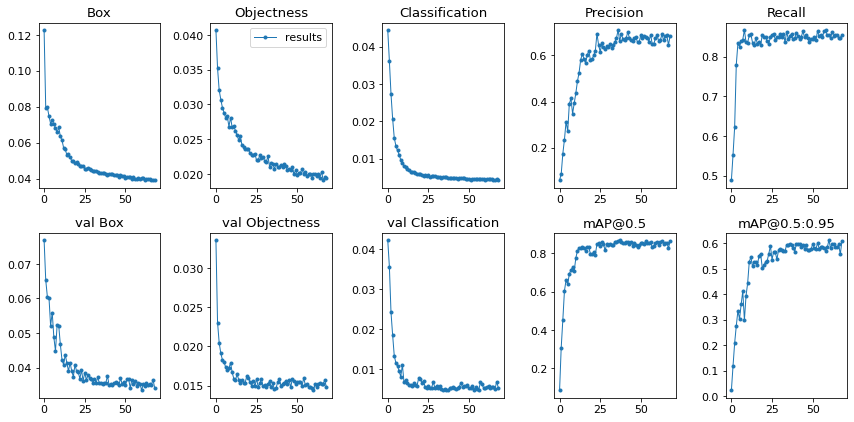

In [ ]:
from utils.general import plot_results 
plot_results(save_dir='runs/exp5')

In [9]:
!ls utils

activations.py	evolve.sh   google_app_engine  __init__.py  torch_utils.py
datasets.py	general.py  google_utils.py    __pycache__


In [10]:
# Test on FSOCO

In [11]:
!python test.py --weights runs/exp5/weights/best.pt --data fsoco.yaml --img 1024 --verbose

Namespace(augment=False, batch_size=32, conf_thres=0.001, data='./data/fsoco.yaml', device='', img_size=1024, iou_thres=0.65, save_conf=False, save_dir='runs/test', save_json=False, save_txt=False, single_cls=False, task='val', verbose=True, weights=['runs/exp5/weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15109MB)

Fusing layers... 
Model Summary: 188 layers, 2.14848e+07 parameters, 0 gradients
Scanning labels ../fsoco/labels/val.cache (541 found, 0 missing, 0 empty, 1 duplicate, for 541 images): 541it [00:00, 14476.13it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 17/17 [05:43<00:00, 20.19s/it]
                 all         541    5.18e+03        0.67       0.856       0.865       0.613
           blue_cone         541    1.52e+03       0.735       0.951       0.957       0.673
         yellow_cone         541    2.15e+03       0.766       0.936       0.947       0.677
         orange_

In [ ]:
!python detect.py --weights runs/exp5/weights/best.pt --img 1024 --conf 0.4 --source inference/images_fsoco_test/

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=1024, iou_thres=0.45, save_conf=False, save_dir='inference/output', save_txt=False, source='inference/images_fsoco_test/', update=False, view_img=False, weights=['runs/exp5/weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

Fusing layers... 
Model Summary: 188 layers, 2.14848e+07 parameters, 0 gradients
image 1/8 /content/drive/My Drive/yolov5/yolov5/inference/images_fsoco_test/amz_00002.jpg: 832x1024 15 blue_cones, 22 yellow_cones, 2 orange_cones, Done. (0.032s)
image 2/8 /content/drive/My Drive/yolov5/yolov5/inference/images_fsoco_test/amz_00065.jpg: 608x1024 10 blue_cones, 4 yellow_cones, Done. (0.031s)
image 3/8 /content/drive/My Drive/yolov5/yolov5/inference/images_fsoco_test/mms_00033.jpg: 864x1024 5 blue_cones, 5 yellow_cones, 8 large_orange_cones, Done. (0.031s)
image 4/8 /content/drive/My Drive/yolov5/yolov5/inference/image

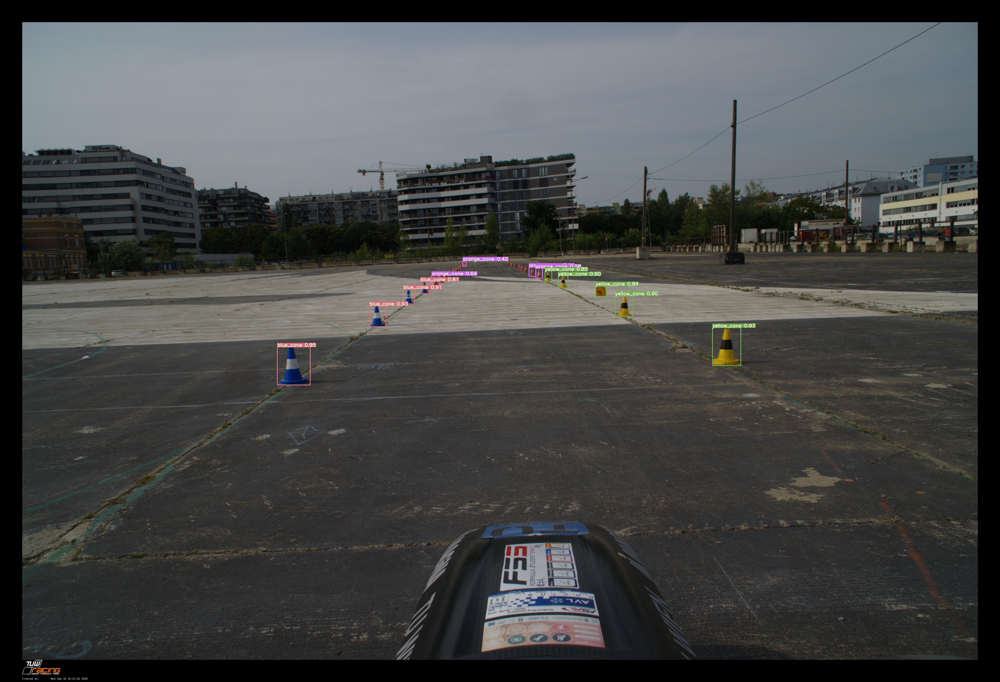

In [ ]:
Image(filename='inference/output/tuwr_00171.jpg', width=1000)

In [ ]:
!python detect.py --weights runs/exp5/weights/best.pt --img 1024 --conf 0.4 --source inference/fsoco_track/

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=1024, iou_thres=0.45, save_conf=False, save_dir='inference/output', save_txt=False, source='inference/fsoco_track/', update=False, view_img=False, weights=['runs/exp5/weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... 
Model Summary: 188 layers, 2.14848e+07 parameters, 0 gradients
image 1/43 /content/drive/My Drive/yolov5/yolov5/inference/fsoco_track/amz_00000.jpg: 832x1024 15 blue_cones, 23 yellow_cones, 2 orange_cones, Done. (0.057s)
image 2/43 /content/drive/My Drive/yolov5/yolov5/inference/fsoco_track/amz_00001.jpg: 832x1024 17 blue_cones, 19 yellow_cones, 2 orange_cones, Done. (0.035s)
image 3/43 /content/drive/My Drive/yolov5/yolov5/inference/fsoco_track/amz_00002.jpg: 832x1024 15 blue_cones, 22 yellow_cones, 2 orange_cones, Done. (0.035s)
image 4/43 /content/drive/My Drive/yolov5/yolov5/inference/fsoco_track/amz_00003.jp

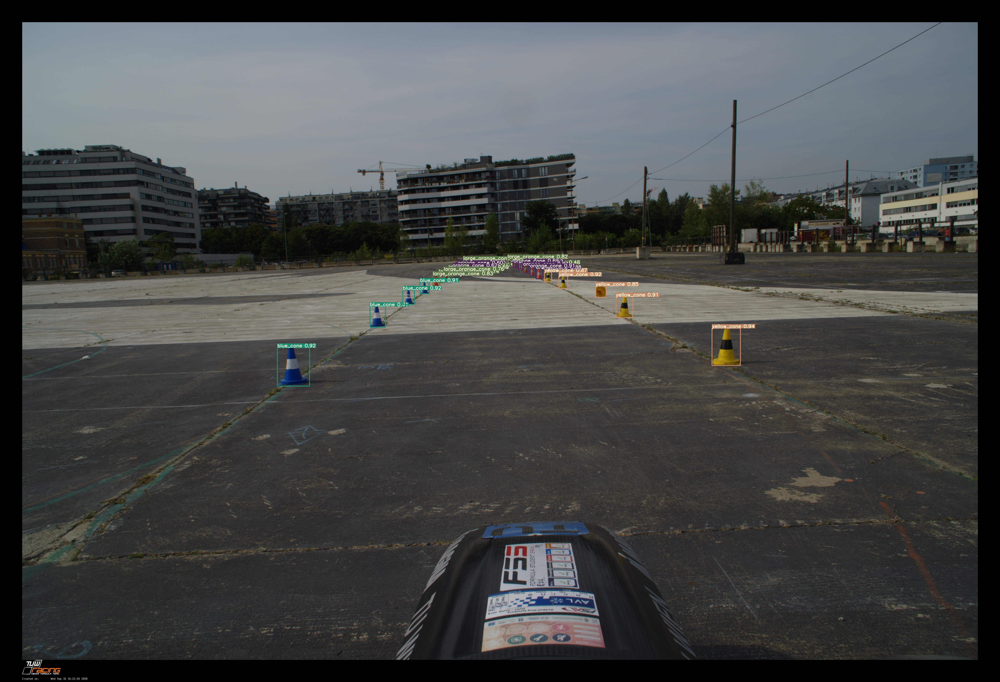

In [ ]:
Image(filename='inference/output/tuwr_00171.jpg', width=1000)

In [ ]:
!ls

sample_data
